# Proyek Pertama: Predictive analisis

* Nama: Junpito Salim
* Email: junpitosalim@gmail.com
* Id Dicoding:

**Latar Belakang**


 Kesehatan hutan memiliki peran penting dalam menjaga keseimbangan ekosistem, mengatur iklim, serta menyediakan berbagai sumber daya bagi kehidupan manusia dan satwa liar. Meningkatnya ancaman terhadap kesehatan hutan, seperti perubahan iklim, kebakaran hutan, dan aktivitas manusia, memerlukan pemantauan yang lebih efektif dan efisien untuk memastikan langkah-langkah pencegahan dan mitigasi dapat dilakukan.

**Problem Statement:** Pemantauan kesehatan hutan secara manual sangat memakan waktu dan sumber daya, terutama dalam area hutan yang luas. Dibutuhkan sebuah sistem otomatis yang mampu mengidentifikasi dan mengklasifikasi kondisi kesehatan pohon secara cepat dan akurat.

**Goals/Tujuan:** Membuat model machine learning untuk mengklasifikasikan kesehatan pohon atau area hutan dengan mengidentifikasi status kesehatan sebagai 'Healthy', 'Very Healthy', 'Sub-healthy', atau 'Unhealthy'. 

**Solution Statement:** 
- Membangun model klasifikasi dengan `Health_Status`(Status kesehatan hutan) sebagai target variable
- Memilih model terbaik dari penerapan machine learning

# 1| Persiapan

## 1.1| Persiapan Librari yang dibutuhkan

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import tensorflow as tf

## 1.2| Persiapan dataset

Tujuan:
- Pada blok ini, kita akan memuat dataset yang akan digunakan untuk pelatihan dan evaluasi model.

Langkah Utama:
- Menggunakan `pandas.read_csv()` untuk membaca file CSV yang berisi data.
- Menampilkan beberapa baris pertama dari dataset untuk memastikan data berhasil dimuat dan struktur data sesuai.

Output yang Diharapkan:
- Menampilkan lima baris pertama dataset sebagai bentuk verifikasi awal.

In [2]:
df = pd.read_csv("/kaggle/input/forest-health-and-ecological-diversity/forest_health_data_with_target.csv")
df.head()

,Plot_ID,Latitude,Longitude,DBH,Tree_Height,Crown_Width_North_South,Crown_Width_East_West,Slope,Elevation,Temperature,Humidity,Soil_TN,Soil_TP,Soil_AP,Soil_AN,Menhinick_Index,Gleason_Index,Disturbance_Level,Fire_Risk_Index,Health_Status
0,1,24.981605,-117.040695,29.862040,20.835684,6.147963,4.542720,29.171563,212.518419,30.209377,93.086241,0.379904,0.268850,0.328882,0.487287,0.682938,2.998681,0.004402,0.812948,Healthy
1,2,48.028572,-92.066934,28.462986,24.307079,8.248891,5.260921,7.757386,641.640332,29.054905,62.028839,0.339583,0.073260,0.044616,0.013501,0.723696,3.986987,0.000330,0.678542,Very Healthy
2,3,39.279758,-68.893791,91.094185,9.013101,7.841448,8.690927,39.257755,2510.612835,8.351397,77.992822,0.184392,0.297665,0.124953,0.474088,2.129934,3.250667,0.472263,0.889075,Healthy
3,4,33.946339,-78.744258,28.706889,19.496475,2.385099,4.060039,27.590231,2323.628233,37.290034,54.883864,0.611194,0.160819,0.387971,0.187495,1.717352,1.333210,0.029294,0.449336,Unhealthy
4,5,16.240746,-73.540720,30.835224,18.008888,2.343245,8.826847,7.074175,1116.863805,24.896527,70.402766,0.481858,0.030913,0.266699,0.009995,2.476038,1.742321,0.974533,0.893890,Unhealthy



# 2| Data Understanding

## 2.1| Jumlah data dan variable

In [3]:
df.shape

(1000, 20)

Dataset yang kita gunakan terdiri dari 1000 baris dan 20 kolom

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Plot_ID                  1000 non-null   int64  
 1   Latitude                 1000 non-null   float64
 2   Longitude                1000 non-null   float64
 3   DBH                      1000 non-null   float64
 4   Tree_Height              1000 non-null   float64
 5   Crown_Width_North_South  1000 non-null   float64
 6   Crown_Width_East_West    1000 non-null   float64
 7   Slope                    1000 non-null   float64
 8   Elevation                1000 non-null   float64
 9   Temperature              1000 non-null   float64
 10  Humidity                 1000 non-null   float64
 11  Soil_TN                  1000 non-null   float64
 12  Soil_TP                  1000 non-null   float64
 13  Soil_AP                  1000 non-null   float64
 14  Soil_AN                  

**Deskripsi Variabel Dataset**

- `Plot_ID`: ID unik untuk setiap plot.
- `Latitude`: Latitude plot dalam derajat.
- `Longitude`: Longitude plot dalam derajat.
- `DBH`: Diameter pohon pada ketinggian dada (cm).
- `ree_Height`: Tinggi total pohon (m).
- `Crown_Width_North_South`: Lebar tajuk pohon arah utara-selatan (m).
- `Crown_Width_East_West`: Lebar tajuk pohon arah timur-barat (m).
- `Slope`: Kemiringan medan (derajat).
- `Elevation`: Ketinggian plot dari permukaan laut (m).
- `Temperature`: Suhu rata-rata di plot (°C).
- `Humidity`: Kelembaban rata-rata di plot (%).
- `Soil_TN`: Kandungan total nitrogen dalam tanah (g/kg).
- `Soil_TP`: Kandungan total fosfor dalam tanah (g/kg).
- `Soil_AP`: Fosfor tersedia dalam tanah (g/kg).
- `Soil_AN`: Nitrogen tersedia dalam tanah (g/kg).
- `Menhinick_Index`: Indeks kekayaan spesies.
- `Gleason_Index`: Indeks keberagaman dan kekayaan spesies.
- `Disturbance_Level`: Tingkat gangguan ekologis (0: rendah, 1: sedang, 2: tinggi).
- `Fire_Risk_Index`: Kemungkinan terjadinya kebakaran (0 hingga 1).
- `Health_Status`: Klasifikasi kesehatan pohon ('Healthy', 'Unhealthy').

In [73]:
#periksa unique value dari dataset
df.nunique().sort_values()

Health_Status                 4
Disturbance_Level          1000
Gleason_Index              1000
Menhinick_Index            1000
Soil_AN                    1000
Soil_AP                    1000
Soil_TP                    1000
Soil_TN                    1000
Humidity                   1000
Plot_ID                    1000
Elevation                  1000
Slope                      1000
Crown_Width_East_West      1000
Crown_Width_North_South    1000
Tree_Height                1000
DBH                        1000
Longitude                  1000
Latitude                   1000
Fire_Risk_Index            1000
Temperature                1000
dtype: int64

Fitur-fitur dengan 1000 nilai unik kemungkinan adalah variabel kontinu atau memiliki rentang nilai yang luas, yang konsisten dengan data lingkungan atau pengukuran ekologis yang seringkali bervariasi antar titik plot.

## 2.2| Memeriksa data kosong dan duplikasi

In [74]:
#periksa data kosong
df.isnull().sum()

Plot_ID                    0
Latitude                   0
Longitude                  0
DBH                        0
Tree_Height                0
Crown_Width_North_South    0
Crown_Width_East_West      0
Slope                      0
Elevation                  0
Temperature                0
Humidity                   0
Soil_TN                    0
Soil_TP                    0
Soil_AP                    0
Soil_AN                    0
Menhinick_Index            0
Gleason_Index              0
Disturbance_Level          0
Fire_Risk_Index            0
Health_Status              0
dtype: int64

Tidak ditemukan data kosong dalam dataset

In [75]:
df.duplicated().sum()

0

Tidak ditemukan juga data duplikasi dalam dataset

## 2.3| Memeriksa outlier data

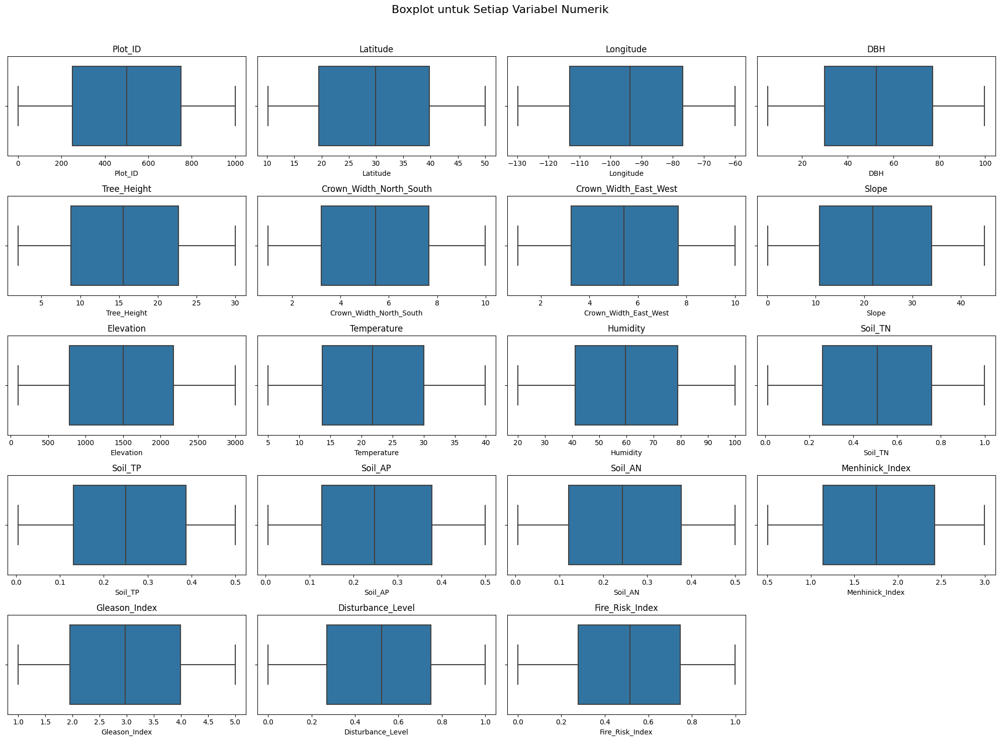

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns

# Memilih hanya kolom numerik dari dataset
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
num_vars = len(numeric_cols)  # Jumlah variabel numerik
num_cols = 4                  # Jumlah kolom dalam grid
num_rows = (num_vars + num_cols - 1) // num_cols  # Menghitung jumlah baris

# Membuat figure dan axis untuk subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))
fig.suptitle('Boxplot untuk Setiap Variabel Numerik', fontsize=16)

# Mengubah axes menjadi array 1D agar lebih mudah diakses
axes = axes.flatten()

# Loop untuk membuat boxplot per variabel numerik
for i, col in enumerate(numeric_cols):
    sns.boxplot(data=df, x=col, ax=axes[i])
    axes[i].set_title(col)

# Menonaktifkan subplot kosong (jika ada)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


Dari setiap viusalisasi boxplot, tidak ditemukan outlier pada seluruh data.

## 2.4| Melihat sebaran data target

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Health_Status', ylabel='Count'>

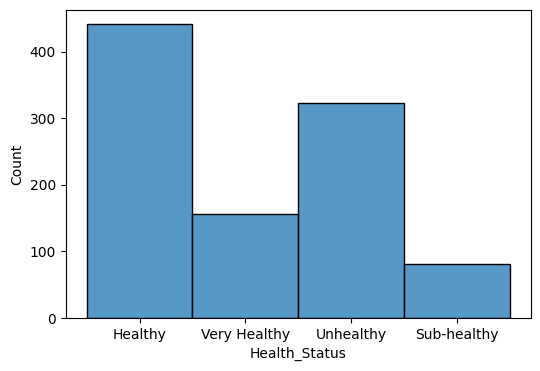

In [77]:
plt.figure(figsize=(6, 4))
sns.histplot(df['Health_Status'],kde=False)

Dari hasil visualisasi bisa kita lihat bahwa sebaran data target tidak seimbang.

# 3| EDA

## 3.1| Deskripsi statistik dari data

Tujuan:
- Menghitung statistik dasar dataset untuk memahami distribusi awal, seperti rata-rata, standar deviasi, nilai minimum, dan maksimum dari setiap kolom.

Langkah Utama:
- Menggunakan fungsi `data.describe()` untuk melihat statistik ringkas.
- Menganalisis statistik ini untuk mendapatkan wawasan awal tentang rentang dan variasi data.

Output yang Diharapkan:
- Tabel yang berisi statistik deskriptif dari setiap kolom numerik, termasuk rata-rata, median, dan rentang.


In [78]:
df.describe()

,Plot_ID,Latitude,Longitude,DBH,Tree_Height,Crown_Width_North_South,Crown_Width_East_West,Slope,Elevation,Temperature,Humidity,Soil_TN,Soil_TP,Soil_AP,Soil_AN,Menhinick_Index,Gleason_Index,Disturbance_Level,Fire_Risk_Index
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,500.500000,29.610262,-94.508789,52.728544,15.730501,5.446948,5.486180,22.198898,1498.874791,22.027384,59.743599,0.510635,0.255100,0.251220,0.249344,1.762232,2.963965,0.512124,0.509207
std,288.819436,11.685494,20.453293,27.614049,8.021702,2.581289,2.602753,13.038014,826.251755,9.878208,22.572259,0.283588,0.146605,0.142471,0.145486,0.724376,1.163286,0.287952,0.281458
min,1.000000,10.185281,-129.774722,5.001105,2.018295,1.000276,1.055654,0.064275,100.698914,5.008503,20.004226,0.010934,0.005078,0.005596,0.005660,0.503300,1.001239,0.000252,0.000854
25%,250.750000,19.438931,-113.124801,29.828343,8.773222,3.204766,3.244420,10.809975,784.368948,13.728430,41.131530,0.260105,0.130452,0.127690,0.121242,1.136698,1.947451,0.270524,0.277123
50%,500.500000,29.872295,-93.688627,52.558322,15.559820,5.451383,5.413625,21.808936,1503.573023,21.754533,59.614944,0.511302,0.249754,0.247471,0.243803,1.752412,2.969374,0.523023,0.516489
75%,750.250000,39.772784,-76.767446,77.114835,22.651143,7.659941,7.658666,34.040896,2171.952127,30.056674,78.897379,0.759135,0.387961,0.377836,0.377283,2.421229,3.987144,0.750194,0.746163
max,1000.000000,49.988707,-60.041039,99.792981,29.987616,9.979745,9.994153,44.975731,2996.823629,39.860447,99.960415,0.999676,0.499671,0.499356,0.499428,2.999513,4.999699,0.999150,0.997163


## 3.2| Sebaran kordinat pada data

Tujuan:
- Melihat sebaran titk kordinat pada peta.

Langkah Utama:

- Menggunakan fungsi Marker pada folium untuk menandakan titik koordinat pada peta.

Output yang Diharapkan:

- Peta yang berisi titik kordinat dari dataset. 


In [79]:
import folium

# Tentukan titik tengah peta berdasarkan data (misalnya rata-rata Latitude dan Longitude)
avg_lat = df['Latitude'].mean()
avg_lon = df['Longitude'].mean()
m = folium.Map(location=[avg_lat, avg_lon], zoom_start=5)

# Tambahkan setiap titik ke peta
for idx, row in df.iterrows():
    # Warna marker berdasarkan 'Health_Status'
    color = (
        'green' if row['Health_Status'] == 'Healthy' else
        'blue' if row['Health_Status'] == 'Very Healthy' else
        'red' if row['Health_Status'] == 'Unhealthy' else
        'orange' if row['Health_Status'] == 'Sub-healthy' else
        'black'  # Default warna hitam jika ada label di luar kategori yang didefinisikan
    )
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Plot ID: {row['Plot_ID']}<br>Health Status: {row['Health_Status']}",
        icon=folium.Icon(color=color)
    ).add_to(m)

# Tampilkan peta
m

Dari gambar terlihat jika titik kordinat hutan tersebar di seluruh amerika serikat.

## 3.3| Analilsis Univariat

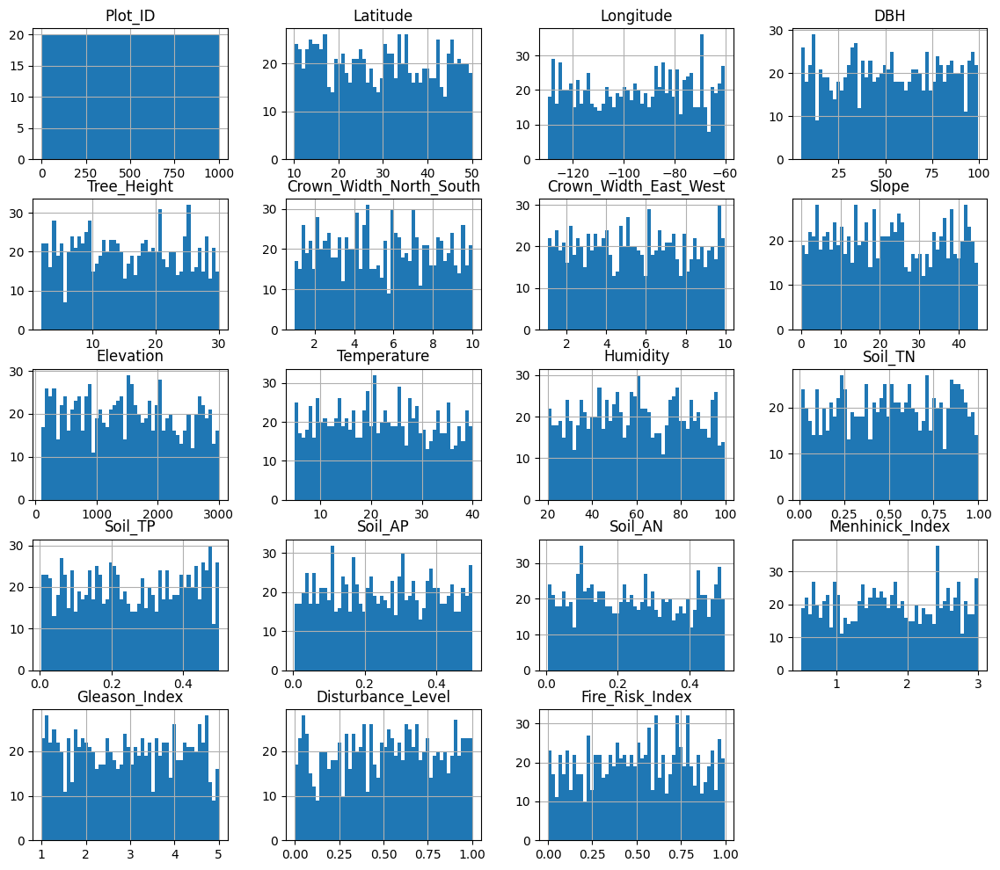

In [80]:
df.hist(bins=50, figsize=(14, 12))
plt.show()

Sebagian besar variabel menunjukkan distribusi yang merata atau mendekati seragam, yang menunjukkan bahwa nilai dalam dataset tersebar hampir merata di seluruh rentang yang tersedia.

## 3.4| Analisis Multivariat

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

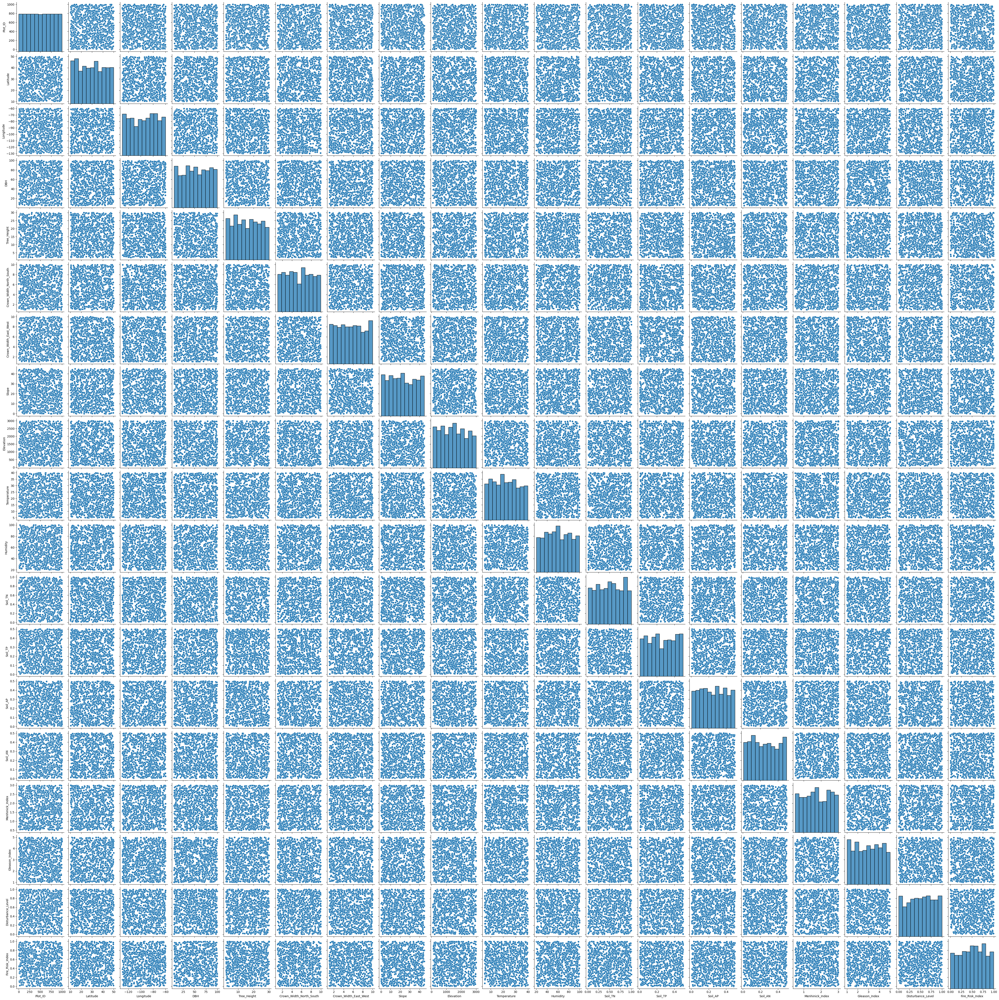

In [81]:
sns.pairplot(df)

* Tidak ada korelasi linier yang kuat antara sebagian besar pasangan fitur.
* Data tersebar secara acak atau memiliki noise yang tinggi, yang berarti bahwa hubungan antar fitur tidak terlihat jelas dalam bentuk pola terstruktur.

In [82]:
df.columns

Index(['Plot_ID', 'Latitude', 'Longitude', 'DBH', 'Tree_Height',
       'Crown_Width_North_South', 'Crown_Width_East_West', 'Slope',
       'Elevation', 'Temperature', 'Humidity', 'Soil_TN', 'Soil_TP', 'Soil_AP',
       'Soil_AN', 'Menhinick_Index', 'Gleason_Index', 'Disturbance_Level',
       'Fire_Risk_Index', 'Health_Status'],
      dtype='object')

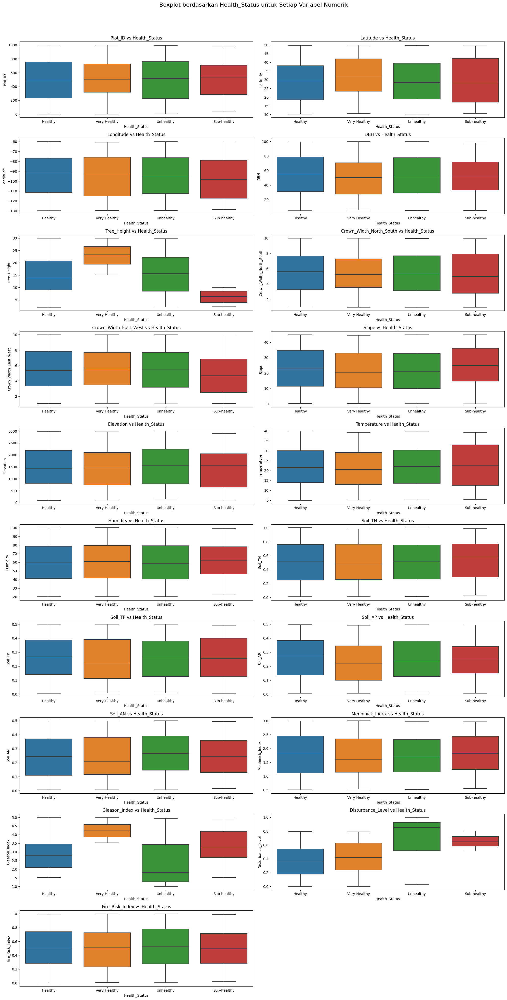

In [83]:
# Memilih kolom numerik dari dataset
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns


# Menghitung jumlah plot yang dibutuhkan
num_vars = len(numeric_cols)
num_cols = 2  # Menentukan jumlah kolom pada grid
num_rows = (num_vars + num_cols - 1) // num_cols  # Menghitung jumlah baris

# Membuat figure dan axis untuk subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 40))
fig.suptitle('Boxplot berdasarkan Health_Status untuk Setiap Variabel Numerik', fontsize=16)

# Mengubah axes menjadi array 1D agar lebih mudah diakses
axes = axes.flatten()

# Loop untuk membuat boxplot per variabel numerik dengan Health_Status sebagai x
for i, col in enumerate(numeric_cols):
    sns.boxplot(data=df, x='Health_Status', y=col, ax=axes[i])
    axes[i].set_title(f'{col} vs Health_Status')

# Menonaktifkan subplot kosong (jika ada)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Dari setiap boxplot bisa dilihat sebaran rata-rata value dari setiap variable terhadap data target.

# 4| Data Preparation

Tujuan:
- Blok cell ini digunakan untuk membersihkan dan mempersiapkan data sebelum masuk ke proses pelatihan model.

Langkah Utama:
- Melakukan *Mapping* pada fitur kategorikal agar bisa digunakan oleh model machine learning.
- Normalisasi fitur numerik agar memiliki rentang yang seragam.
- Melakukan splitting data agar model bisa di evaluasi menggunakan data yang tidak dilihat model selama pelatihan.
- Melakukan oversampling agar setiap kelas pada data menjadi seimbang.

Output yang Diharapkan:
- Dataset yang siap digunakan dalam pelatihan Model.


## 4.1| Mapping target ke numerik

Pada tahap ini kita akan mengubah data kategorical pada variable target menjadi numerical agar bisa di-feed ke dalam model machine learning.

In [5]:
df['Health_Status'].unique()

array(['Healthy', 'Very Healthy', 'Unhealthy', 'Sub-healthy'],
      dtype=object)

In [6]:
# Membuat mapping kategori ke numerik
health_status_mapping = {
    'Healthy': 0,
    'Very Healthy': 1,
    'Unhealthy': 2,
    'Sub-healthy': 3
}

# Menggunakan .map() untuk mengonversi nilai kategori ke numerik
df['Health_Status'] = df['Health_Status'].map(health_status_mapping)

# Cek hasilnya
print(df[['Health_Status']].head())

   Health_Status
0              0
1              1
2              0
3              2
4              2


## 4.2| Feature correlation

In [7]:

df.corr()['Health_Status']

Plot_ID                    0.015944
Latitude                   0.007936
Longitude                 -0.035393
DBH                       -0.040027
Tree_Height               -0.153506
Crown_Width_North_South   -0.019514
Crown_Width_East_West     -0.036647
Slope                     -0.006868
Elevation                  0.001238
Temperature                0.003802
Humidity                   0.016902
Soil_TN                    0.010641
Soil_TP                   -0.004829
Soil_AP                   -0.029988
Soil_AN                    0.059957
Menhinick_Index           -0.031924
Gleason_Index             -0.095623
Disturbance_Level          0.506974
Fire_Risk_Index            0.021210
Health_Status              1.000000
Name: Health_Status, dtype: float64

## 4.3| Feature scaling

Pada tahap ini kita akan menormalisasikan setiap fitur dalam data ke skala yang sama.

In [8]:
scaler=StandardScaler()
scaled_df=scaler.fit_transform(df.drop(['Health_Status','Plot_ID','Latitude','Longitude'],axis=1))
X=scaled_df
Y=df['Health_Status'].values

Standard Scaler menghitung statistik rata-rata (mean) dan standar deviasi (std) dari setiap fitur pada data training, lalu menerapkannya dengan rumus berikut:

`X_scaled = (X - mean) / std`

## 4.4| Splitting data

Pada tahap ini, data akan dibagi kedalam train dan test

In [9]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.2,random_state=42)

In [10]:
x_train.shape

(800, 16)

In [11]:
x_test.shape

(200, 16)

## 4.5| Oversampling

**Oversampling** adalah teknik dalam machine learning untuk mengatasi ketidakseimbangan data, terutama pada dataset klasifikasi. 

In [12]:
from imblearn.over_sampling import SMOTE

oversampler = SMOTE(random_state=42)
x_train_smote, y_train_smote = oversampler.fit_resample(x_train, y_train)

`Synthetic Minority Over-sampling Technique (SMOTE)`, adalah teknik oversamplling yang membuat sampel sintetis baru berdasarkan sampel kelas minoritas yang ada.

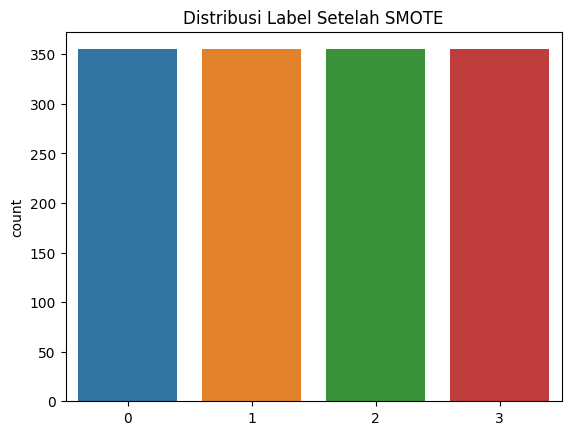

In [13]:
sns.countplot(x=y_train_smote)
plt.title('Distribusi Label Setelah SMOTE')
plt.show()

In [14]:
y_train_smote.shape

(1420,)

# 5| Pemodelan dan evaluasi model

Tujuan:
- Membuat dan melatih model machine learning menggunakan data pelatihan untuk memprediksi *Health_Status*.

Langkah Utama:
- Menginisialisasi model ( Neural Network, Random Forest, atau XGBoost).
- Melakukan *fit* atau pelatihan model dengan data pelatihan.

Output yang Diharapkan:
- Model yang telah dilatih dengan data, siap untuk melakukan prediksi pada data pengujian.


## 5.1| Neural network

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.regularizers import l2

# Model
model = Sequential()
model.add(Dense(input_dim=16, units=16, activation='relu'))  # Menyesuaikan input_dim menjadi 19
model.add(Dense(units=32, activation='relu', kernel_regularizer=l2(0.01)))
#model.add(Dense(units=64, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(units=4, activation='softmax'))  # Menggunakan 4 output untuk klasifikasi multi-kelas


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [16]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           132 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 948 (3.70 KB)

 Trainable params: 948 (3.70 KB)

 Non-trainable params: 0 (0.00 B)

In [17]:
# Reset states generated by Keras
tf.keras.backend.clear_session()
# Get initial weights
init_weights = model.get_weights()
# Reset the weights
model.set_weights(init_weights)

In [18]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy

# Kompilasi model
model.compile(optimizer='adam', loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [19]:
History=model.fit(x_train_smote,y_train_smote,validation_data=(x_test,y_test),epochs=100,verbose=1)

Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.2326 - loss: 1.6910 - val_accuracy: 0.3750 - val_loss: 1.5196
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3005 - loss: 1.5419 - val_accuracy: 0.4250 - val_loss: 1.4480
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4182 - loss: 1.4293 - val_accuracy: 0.4750 - val_loss: 1.3840
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5343 - loss: 1.3192 - val_accuracy: 0.4800 - val_loss: 1.3075
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5895 - loss: 1.2114 - val_accuracy: 0.4950 - val_loss: 1.2156
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6436 - loss: 1.0855 - val_accuracy: 0.5450 - val_loss: 1.1279
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7088 - loss: 0.9297 - val_accuracy: 0.5750 - val_loss: 1.0512
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7403 - loss: 0.8051 - val_accuracy: 0.6100 - v

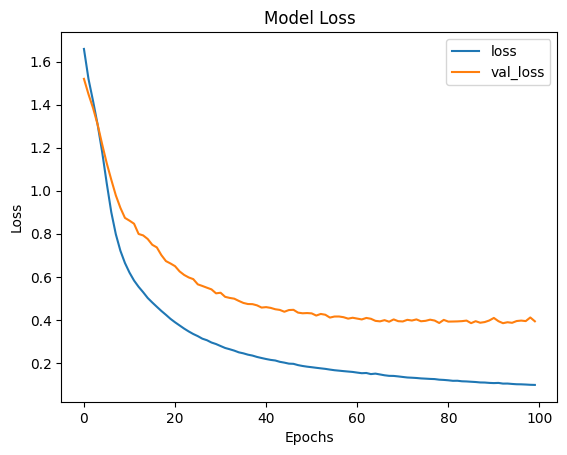

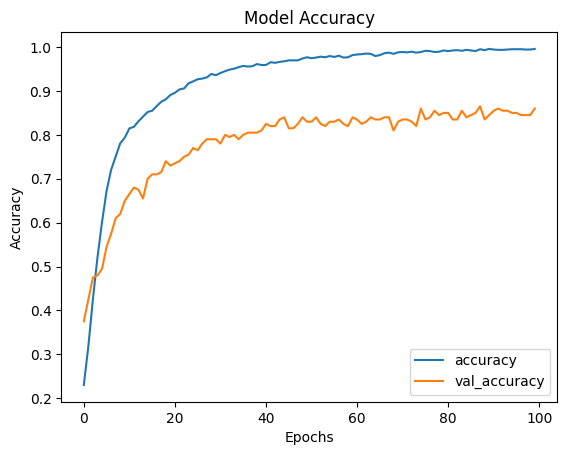

In [20]:
plt.plot(History.history['loss'])
plt.plot(History.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['loss', 'val_loss'])
plt.show()

plt.plot(History.history['accuracy'])
plt.plot(History.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['accuracy', 'val_accuracy'])
plt.show()

### Evaluasi Neural network

Dalam evaluasi tugas klasifikasi kita menggunakan beberapa metriks:
* `Precision` mengukur akurasi prediksi positif model. Ini menunjukkan proporsi sampel yang diprediksi sebagai positif yang benar-benar positif.
`Precision = True positives / (True Positives + False Positives)`
* `Recall`, juga dikenal sebagai sensitivitas atau true positive rate, mengukur seberapa baik model mendeteksi semua sampel yang benar-benar positif.
`Recall = True positives / (True Positives + False Negatives)`
* `F1-Score` merupakan rata-rata harmonis dari Precision dan Recall, yang memberikan gambaran umum mengenai kinerja model dengan mempertimbangkan keseimbangan antara keduanya.
* `Confusion Matrix` menunjukkan jumlah prediksi benar dan salah untuk setiap kelas dalam bentuk matriks. 

In [30]:
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

In [28]:
y_pred_nn = model.predict(x_test)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


In [34]:
# Mengonversi probabilitas menjadi label prediksi
y_pred_nn_labels = np.argmax(y_pred_nn, axis=1)

# Menghitung F1-Score pada label diskret
f1_nn = f1_score(y_test, y_pred_nn_labels, average='weighted')  
precision_nn = precision_score(y_test, y_pred_nn_labels, average='weighted')
recall_nn = recall_score(y_test, y_pred_nn_labels, average='weighted')
print("F1-Score:", f1_nn)
print("Precision:", precision_nn)
print("Recall:", recall_nn)

F1-Score: 0.859481334426654
Precision: 0.8594642857142858
Recall: 0.86


In [38]:
model.evaluate(x_test,y_test)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8511 - loss: 0.4318 


[0.3935469388961792, 0.8600000143051147]

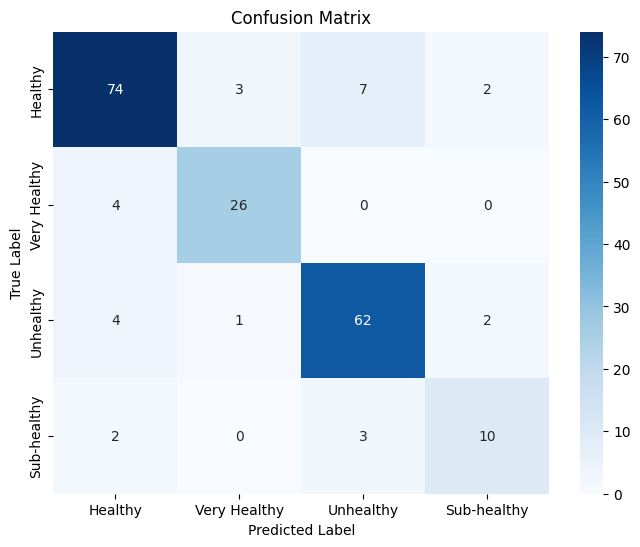

In [37]:
cm_nn = confusion_matrix(y_test, y_pred_nn_labels)

# Visualisasi menggunakan heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_nn, annot=True, fmt="d", cmap="Blues", xticklabels=['Healthy', 'Very Healthy', 'Unhealthy', 'Sub-healthy'],
            yticklabels=['Healthy', 'Very Healthy', 'Unhealthy', 'Sub-healthy'])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## 5.2| Random Foreast

In [21]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Inisialisasi model Random Forest
rf_model = RandomForestClassifier(random_state=42)

# Tentukan rentang nilai n_estimators yang akan diuji
param_grid = {'n_estimators': [50, 100, 200, 300]}

# Grid Search
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(x_train_smote, y_train_smote)

# Menampilkan hasil Grid Search
print("Best n_estimators:", grid_search.best_params_['n_estimators'])
print("Best accuracy:", grid_search.best_score_)

Best n_estimators: 50
Best accuracy: 0.997887323943662


In [25]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# Ambil nilai n_estimators terbaik dari hasil tuning
best_n_estimators = grid_search.best_params_['n_estimators']

# Buat ulang model dengan n_estimators yang optimal
rf_model = RandomForestClassifier(n_estimators=best_n_estimators, random_state=42)

# Latih model dengan data training
rf_model.fit(x_train_smote, y_train_smote)

# Evaluasi model pada data training
y_train_pred = rf_model.predict(x_train_smote)
train_accuracy = accuracy_score(y_train_smote, y_train_pred)

print("Train Accuracy:", train_accuracy)

Train Accuracy: 1.0


### Random forest Evaluasi

Dalam evaluasi tugas klasifikasi kita menggunakan beberapa metriks:
* `Precision` mengukur akurasi prediksi positif model. Ini menunjukkan proporsi sampel yang diprediksi sebagai positif yang benar-benar positif.
`Precision = True positives / (True Positives + False Positives)`
* `Recall`, juga dikenal sebagai sensitivitas atau true positive rate, mengukur seberapa baik model mendeteksi semua sampel yang benar-benar positif.
`Recall = True positives / (True Positives + False Negatives)`
* `F1-Score` merupakan rata-rata harmonis dari Precision dan Recall, yang memberikan gambaran umum mengenai kinerja model dengan mempertimbangkan keseimbangan antara keduanya.
* `Confusion Matrix` menunjukkan jumlah prediksi benar dan salah untuk setiap kelas dalam bentuk matriks. 

In [40]:
# Evaluasi model pada data testing
y_pred_rf = rf_model.predict(x_test)
test_accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Test Accuracy:", test_accuracy_rf)

Test Accuracy: 1.0


In [43]:
# Menghitung metrik evaluasi
f1_rf = f1_score(y_test, y_pred_rf, average='weighted')
precision_rf = precision_score(y_test, y_pred_rf, average='weighted')
recall_rf = recall_score(y_test, y_pred_rf, average='weighted')

print("F1-Score:", f1_rf)
print("Precision:", precision_rf)
print("Recall:", recall_rf)

F1-Score: 1.0
Precision: 1.0
Recall: 1.0


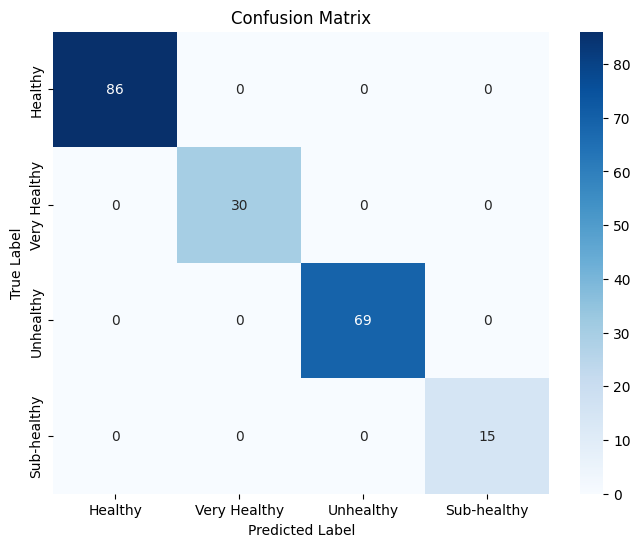

In [44]:
# Membuat Confusion Matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)

# Visualisasi Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Blues", xticklabels=['Healthy', 'Very Healthy', 'Unhealthy', 'Sub-healthy'],
            yticklabels=['Healthy', 'Very Healthy', 'Unhealthy', 'Sub-healthy'])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## 5.3| XGboost

In [27]:
from xgboost import XGBClassifier

# Inisialisasi model XGBoost
xgb_model = XGBClassifier(
    n_estimators=100,      # Jumlah pohon dalam ensemble
    max_depth=6,           # Kedalaman maksimum setiap pohon
    learning_rate=0.1,     # Learning rate atau eta
    subsample=0.8,         # Rasio sampel untuk setiap pohon
    colsample_bytree=0.8,  # Rasio sampel kolom untuk setiap pohon
    random_state=42
)

# Melatih model
xgb_model.fit(x_train_smote, y_train_smote)

# Evaluasi model pada data training
y_train_pred = xgb_model.predict(x_train_smote)
train_accuracy = accuracy_score(y_train_smote, y_train_pred)

print("Train Accuracy:", train_accuracy)

Train Accuracy: 1.0


### XGboost evaluasi

Dalam evaluasi tugas klasifikasi kita menggunakan beberapa metriks:
* `Precision` mengukur akurasi prediksi positif model. Ini menunjukkan proporsi sampel yang diprediksi sebagai positif yang benar-benar positif.
`Precision = True positives / (True Positives + False Positives)`
* `Recall`, juga dikenal sebagai sensitivitas atau true positive rate, mengukur seberapa baik model mendeteksi semua sampel yang benar-benar positif.
`Recall = True positives / (True Positives + False Negatives)`
* `F1-Score` merupakan rata-rata harmonis dari Precision dan Recall, yang memberikan gambaran umum mengenai kinerja model dengan mempertimbangkan keseimbangan antara keduanya.
* `Confusion Matrix` menunjukkan jumlah prediksi benar dan salah untuk setiap kelas dalam bentuk matriks. 

In [46]:
# Evaluasi model pada data testing
y_pred_xgb = xgb_model.predict(x_test)
test_accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("Test Accuracy:", test_accuracy_xgb)

Test Accuracy: 0.99


In [48]:
# Menghitung metrik evaluasi
f1_xgb = f1_score(y_test, y_pred_rf, average='weighted')
precision_xgb = precision_score(y_test, y_pred_xgb, average='weighted')
recall_xgb = recall_score(y_test, y_pred_xgb, average='weighted')

print("F1-Score:", f1_xgb)
print("Precision:", precision_xgb)
print("Recall:", recall_xgb)

F1-Score: 1.0
Precision: 0.9900714285714287
Recall: 0.99


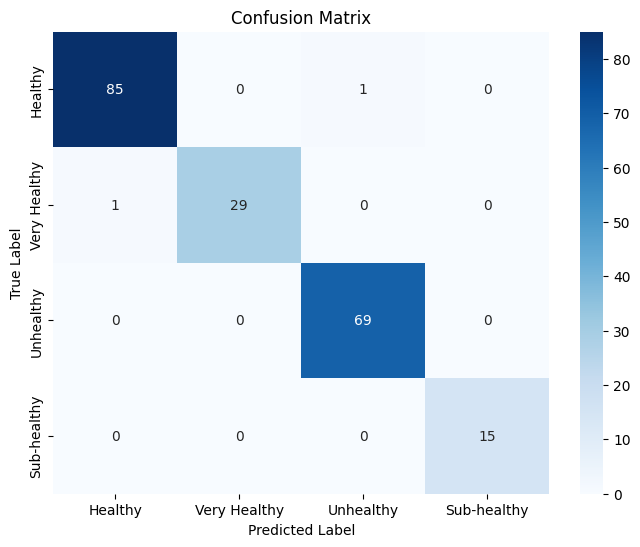

In [49]:
# Membuat Confusion Matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)

# Visualisasi Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Blues", xticklabels=['Healthy', 'Very Healthy', 'Unhealthy', 'Sub-healthy'],
            yticklabels=['Healthy', 'Very Healthy', 'Unhealthy', 'Sub-healthy'])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Freezz Requitment txt

In [50]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
